Importing the libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import geopandas as gpd
import seaborn as sns


Importing Dataset

In [2]:
df = pd.read_csv(r"state_confirmed.csv", parse_dates=['Date'])
df.head(5)

,Date,Status,AN,AP,AR,AS,BR,CH,CT,DN,...,PY,PB,RJ,SK,TN,TG,TR,UP,UT,WB
0,2020-03-14,Confirmed,0,1,0,0,0,0,0,0,...,0,1,3,0,1,1,0,12,0,0
1,2020-03-14,Recovered,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,4,0,0
2,2020-03-14,Deceased,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2020-03-15,Confirmed,0,0,0,0,0,0,0,0,...,0,0,1,0,0,2,0,1,0,0
4,2020-03-15,Recovered,0,0,0,0,0,0,0,0,...,0,0,2,0,0,1,0,0,0,0


In [3]:
# Cleaning and Preparing Data for visualization

In [4]:
indexNames = df[ df['Status'] == 'Deceased'].index
df.drop(indexNames , inplace=True)
indexNames = df[ df['Status'] == 'Recovered'].index
df.drop(indexNames , inplace=True)
df.head(5)


,Date,Status,AN,AP,AR,AS,BR,CH,CT,DN,...,PY,PB,RJ,SK,TN,TG,TR,UP,UT,WB
0,2020-03-14,Confirmed,0,1,0,0,0,0,0,0,...,0,1,3,0,1,1,0,12,0,0
3,2020-03-15,Confirmed,0,0,0,0,0,0,0,0,...,0,0,1,0,0,2,0,1,0,0
6,2020-03-16,Confirmed,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,1,0
9,2020-03-17,Confirmed,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,2,0,1
12,2020-03-18,Confirmed,0,0,0,0,0,0,0,0,...,0,1,3,0,1,8,0,2,1,0


In [5]:
df_1=df.drop(['Status'], axis=1)

In [6]:
df_1.set_index(pd.DatetimeIndex(df_1['Date']), inplace=True)

In [7]:
df_2=df_1.drop(['Date'], axis=1)
df_2.head(5)

,AN,AP,AR,AS,BR,CH,CT,DN,DD,DL,...,PY,PB,RJ,SK,TN,TG,TR,UP,UT,WB
Date,,,,,,,,,,,,,,,,,,,,,
2020-03-14,0,1,0,0,0,0,0,0,0,7,...,0,1,3,0,1,1,0,12,0,0
2020-03-15,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,2,0,1,0,0
2020-03-16,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,1,0
2020-03-17,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,1,0,2,0,1
2020-03-18,0,0,0,0,0,0,0,0,0,2,...,0,1,3,0,1,8,0,2,1,0


In [8]:
df_3=df_2.resample('M').sum()
df_3.head()


,AN,AP,AR,AS,BR,CH,CT,DN,DD,DL,...,PY,PB,RJ,SK,TN,TG,TR,UP,UT,WB
Date,,,,,,,,,,,,,,,,,,,,,
2020-03-31,10,44,0,1,21,15,9,0,0,120,...,1,42,93,0,124,97,0,104,7,37
2020-04-30,23,1359,1,42,404,59,31,0,0,3395,...,7,438,2491,0,2199,941,3,2107,50,721
2020-05-31,0,2168,3,1297,3382,219,458,2,0,16329,...,62,1783,6247,1,20010,1660,313,5864,850,4743
2020-06-30,64,11024,187,6966,6181,147,2360,213,0,67516,...,644,3305,9177,87,67834,13641,1077,15417,1974,13058
2020-07-31,447,126338,1400,31862,40999,611,6334,936,0,48238,...,2760,10551,24075,564,155692,46364,3603,61969,4302,51629


In [9]:
df_4=df_3.transpose()
df_4.head()

Date,2020-03-31,2020-04-30,2020-05-31,2020-06-30,2020-07-31,2020-08-31,2020-09-30,2020-10-31,2020-11-30,2020-12-31,2021-01-31,2021-02-28,2021-03-31
AN,10,23,0,64,447,2584,703,497,378,235,49,26,11
AP,44,1359,2168,11024,126338,293838,258713,129864,44716,14222,5550,2080,1945
AR,0,1,3,187,1400,2521,5684,5056,1430,437,109,8,4
AS,1,42,1297,6966,31862,68771,71770,25540,6425,3435,930,396,260
BR,21,404,3382,6181,40999,85350,46569,33858,18852,17176,7927,1815,491


In [10]:
df_4.reset_index(level=0, inplace=True)
df_4.head()

Date,index,2020-03-31 00:00:00,2020-04-30 00:00:00,2020-05-31 00:00:00,2020-06-30 00:00:00,2020-07-31 00:00:00,2020-08-31 00:00:00,2020-09-30 00:00:00,2020-10-31 00:00:00,2020-11-30 00:00:00,2020-12-31 00:00:00,2021-01-31 00:00:00,2021-02-28 00:00:00,2021-03-31 00:00:00
0,AN,10,23,0,64,447,2584,703,497,378,235,49,26,11
1,AP,44,1359,2168,11024,126338,293838,258713,129864,44716,14222,5550,2080,1945
2,AR,0,1,3,187,1400,2521,5684,5056,1430,437,109,8,4
3,AS,1,42,1297,6966,31862,68771,71770,25540,6425,3435,930,396,260
4,BR,21,404,3382,6181,40999,85350,46569,33858,18852,17176,7927,1815,491


In [11]:
df_5=df_4.set_axis(['States','March', 'April','May','June','July','August','September','October', 'November','December', 'Jan 2021','Feb 2021','Mar 2021'], axis=1, inplace=False)
df_5.head()


,States,March,April,May,June,July,August,September,October,November,December,Jan 2021,Feb 2021,Mar 2021
0,AN,10,23,0,64,447,2584,703,497,378,235,49,26,11
1,AP,44,1359,2168,11024,126338,293838,258713,129864,44716,14222,5550,2080,1945
2,AR,0,1,3,187,1400,2521,5684,5056,1430,437,109,8,4
3,AS,1,42,1297,6966,31862,68771,71770,25540,6425,3435,930,396,260
4,BR,21,404,3382,6181,40999,85350,46569,33858,18852,17176,7927,1815,491


In [12]:
fp = "Indian_States.shp"
map_df = gpd.read_file(fp)
map_df.head()

,st_nm,geometry
0,Andaman & Nicobar Island,"MULTIPOLYGON (((93.71976 7.20707, 93.71909 7.2..."
1,Arunanchal Pradesh,"POLYGON ((96.16261 29.38078, 96.16860 29.37432..."
2,Assam,"MULTIPOLYGON (((89.74323 26.30362, 89.74290 26..."
3,Bihar,"MULTIPOLYGON (((84.50720 24.26323, 84.50355 24..."
4,Chandigarh,"POLYGON ((76.84147 30.75996, 76.83599 30.73623..."


In [13]:
map_df.reset_index(level=0, inplace=True)
map_df.drop('index', axis=1, inplace=True)
map_df.head(30)

,st_nm,geometry
0,Andaman & Nicobar Island,"MULTIPOLYGON (((93.71976 7.20707, 93.71909 7.2..."
1,Arunanchal Pradesh,"POLYGON ((96.16261 29.38078, 96.16860 29.37432..."
2,Assam,"MULTIPOLYGON (((89.74323 26.30362, 89.74290 26..."
3,Bihar,"MULTIPOLYGON (((84.50720 24.26323, 84.50355 24..."
4,Chandigarh,"POLYGON ((76.84147 30.75996, 76.83599 30.73623..."
5,Chhattisgarh,"POLYGON ((83.33532 24.09885, 83.35346 24.09627..."
6,Dadara & Nagar Havelli,"POLYGON ((73.20657 20.12216, 73.20797 20.10650..."
7,Daman & Diu,"MULTIPOLYGON (((72.89335 20.44539, 72.89281 20..."
8,Goa,"MULTIPOLYGON (((74.11918 14.75344, 74.11350 14..."
9,Gujarat,"MULTIPOLYGON (((71.70375 20.99958, 71.70375 20..."


In [14]:
map_df.at[23,'st_nm']= 'Delhi'

In [15]:
map_df=map_df.sort_values('st_nm')

In [16]:
map_df.reset_index(level=0, inplace=True)
map_df.drop('index', axis=1, inplace=True)
map_df.head()

,st_nm,geometry
0,Andaman & Nicobar Island,"MULTIPOLYGON (((93.71976 7.20707, 93.71909 7.2..."
1,Andhra Pradesh,"MULTIPOLYGON (((81.10380 17.82269, 81.10610 17..."
2,Arunanchal Pradesh,"POLYGON ((96.16261 29.38078, 96.16860 29.37432..."
3,Assam,"MULTIPOLYGON (((89.74323 26.30362, 89.74290 26..."
4,Bihar,"MULTIPOLYGON (((84.50720 24.26323, 84.50355 24..."


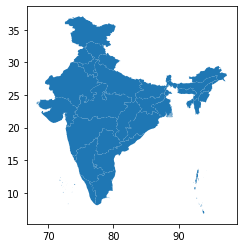

In [17]:
map_df.plot()

In [18]:
merged = map_df.join(df_5)
merged

,st_nm,geometry,States,March,April,May,June,July,August,September,October,November,December,Jan 2021,Feb 2021,Mar 2021
0,Andaman & Nicobar Island,"MULTIPOLYGON (((93.71976 7.20707, 93.71909 7.2...",AN,10,23,0,64,447,2584,703,497,378,235,49,26,11
1,Andhra Pradesh,"MULTIPOLYGON (((81.10380 17.82269, 81.10610 17...",AP,44,1359,2168,11024,126338,293838,258713,129864,44716,14222,5550,2080,1945
2,Arunanchal Pradesh,"POLYGON ((96.16261 29.38078, 96.16860 29.37432...",AR,0,1,3,187,1400,2521,5684,5056,1430,437,109,8,4
3,Assam,"MULTIPOLYGON (((89.74323 26.30362, 89.74290 26...",AS,1,42,1297,6966,31862,68771,71770,25540,6425,3435,930,396,260
4,Bihar,"MULTIPOLYGON (((84.50720 24.26323, 84.50355 24...",BR,21,404,3382,6181,40999,85350,46569,33858,18852,17176,7927,1815,491
5,Chandigarh,"POLYGON ((76.84147 30.75996, 76.83599 30.73623...",CH,15,59,219,147,611,3295,7592,2480,2991,2339,1177,845,1326
6,Chhattisgarh,"POLYGON ((83.33532 24.09885, 83.35346 24.09627...",CT,9,31,458,2360,6334,22311,82099,73668,50052,42253,25792,7193,4769
7,Dadara & Nagar Havelli,"POLYGON ((73.20657 20.12216, 73.20797 20.10650...",DN,0,0,2,213,936,1218,671,206,78,37,16,8,32
8,Daman & Diu,"MULTIPOLYGON (((72.89335 20.44539, 72.89281 20...",DD,0,0,0,0,0,0,0,0,0,0,0,0,0
9,Delhi,"POLYGON ((77.09361 28.86940, 77.10973 28.86722...",DL,120,3395,16329,67516,48238,39150,104967,106991,183668,54995,9727,4193,4407


In [19]:
merged.describe()

,March,April,May,June,July,August,September,October,November,December,Jan 2021,Feb 2021,Mar 2021
count,36.000000,36.000000,36.000000,36.000000,36.000000,36.000000,36.000000,36.000000,36.000000,36.000000,36.000000,36.000000,36.000000
mean,45.416667,923.111111,4174.722222,10931.416667,31063.250000,55287.500000,72842.305556,52028.916667,35551.694444,22862.666667,13119.916667,9817.416667,7586.166667
std,68.910864,1926.122141,10182.316592,22613.676526,52317.245591,85781.869735,111909.389302,72462.552722,48201.844296,33062.769896,31165.580892,29625.401181,26693.742088
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,2.750000,57.250000,365.250000,1348.750000,3117.250000,5445.750000,4678.500000,2098.750000,1097.750000,317.250000,201.750000,39.750000
50%,9.500000,84.000000,811.000000,2766.500000,9687.500000,26039.000000,41477.000000,20744.000000,18008.500000,13010.000000,4499.000000,1696.000000,1015.500000
75%,69.500000,776.000000,2837.500000,11273.250000,34146.250000,63505.250000,85142.000000,71664.750000,51887.250000,35359.250000,10625.500000,4533.500000,4366.500000
max,302.000000,10196.000000,57157.000000,107106.000000,247357.000000,370423.000000,591905.000000,293960.000000,183668.000000,157951.000000,168245.000000,130225.000000,159343.000000


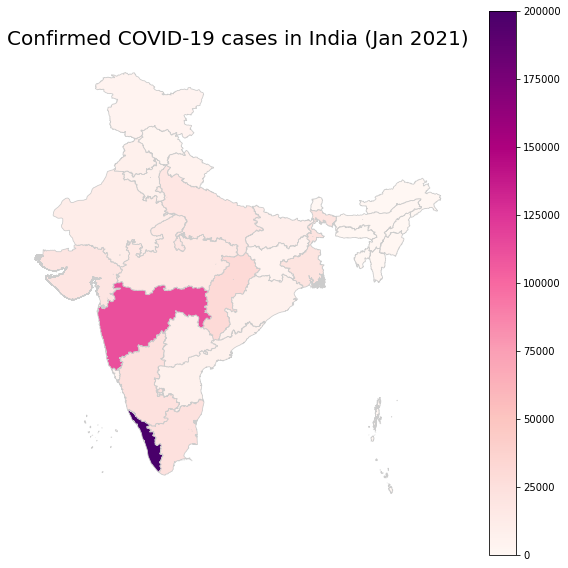

In [20]:
variable = 'Jan 2021'
vmin, vmax = 0, 200000
fig, ax = plt.subplots(1, figsize=(10, 10))
merged.plot(column=variable, cmap='RdPu', linewidth=0.8, ax=ax, edgecolor='0.8')
ax.axis('off')
ax.set_title('Confirmed COVID-19 cases in India (Jan 2021)', fontdict={'fontsize': '20', 'fontweight' : '5'})
sm = plt.cm.ScalarMappable(cmap='RdPu', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cbar = fig.colorbar(sm)